### **Multi-Agent Q-Learning transmit agent**

In [1]:
#!pip install stable_baselines3[extra]
!pip install -U pygame
!pip install gym

In [2]:
import numpy as np
import gym
from gym import spaces
import cv2
from google.colab.patches import cv2_imshow
from google.colab import output
import time 
import os, sys
os.environ["SDL_VIDEODRIVER"] = "dummy"
import matplotlib.pyplot as plt
import networkx as nx
from networkx.drawing.nx_agraph import write_dot
from networkx.drawing.nx_pydot import write_dot

import pygame
from sklearn.preprocessing import normalize
import graphviz
from graphviz import Source
#np.set_printoptions(threshold=sys.maxsize)
np.set_printoptions(edgeitems=30, linewidth=100000, 
    formatter=dict(float=lambda x: "%.3g" % x))


pygame 2.1.2 (SDL 2.0.16, Python 3.7.13)
Hello from the pygame community. https://www.pygame.org/contribute.html


## Global simulation parameters

In [3]:
number_of_iterations = 200000
force_policy_flag = True
number_of_agents = 10

#model
MAX_SILENT_TIME = 6
SILENT_THRESHOLD = 3
BATTERY_SIZE = 6
DISCHARGE = 2
MINIMAL_CHARGE = 2
CHARGE = 1

#learning params
GAMMA = 0.99
ALPHA = 0.1
P_LOSS = 0.1
decay_rate = 0.9999

#for rendering
DATA_SIZE = 10

#Env

In [4]:
class transmit_env(gym.Env):
  metadata = {'render.modes': ['human']}

  def __init__(self, battery_size, max_silence_time, time_threshold, minimal_charge, discharge_rate, charge_rate, data_size):
    super(transmit_env,self).__init__()

    #set env parameters
    self.battery_size = battery_size
    self.max_silence_time = max_silence_time
    self.time_threshold = time_threshold
    self.minimal_charge = minimal_charge
    self.discharge_rate = discharge_rate
    self.charge_rate = charge_rate
    self.data_size = data_size

    #reward functions
    'self.r_1 = np.append(np.zeros(self.time_threshold-1),-1*np.ones(self.max_silence_time  - self.time_threshold))'
    self.r_1 = np.append(np.zeros(self.time_threshold-1),-1*np.linspace(0, 8*(self.max_silence_time  - self.time_threshold), self.max_silence_time+1  - self.time_threshold+1))
    

    #action space
    self.action_space = spaces.Discrete(2)

    #state space
    self.state_space = spaces.Tuple((spaces.Discrete(self.max_silence_time), spaces.Discrete(self.battery_size)))
    self.initial_energy = self.battery_size
    self.initial_silence = 0
    self.initial_state = [self.initial_energy-1 , self.initial_silence]
    self.state = self.initial_state
    self.new_state = self.initial_state

    #Screen size of data
    self.screen = pygame.display.set_mode((data_size * 100 , 100))


  def time_step(self, action, channel, ack):
    #take action accoring to policy (epsilon-greedy) and get reward and next state
    #######################################################
    current_energy, silent_time = self.state
    reward = 0
    if action: # agent choose to transmit and discharge
      if current_energy < self.minimal_charge:
        raise ValueError('No charge left, can not transmit')
      else:
        current_energy -= self.discharge_rate

      if channel>1: #Someone else transmited along with agent - collision
        silent_time += 1
        occupied = 1
      else: #Agent made a sucsessful report!
        if ack: #Gateway responded!
          silent_time = 0
          reward += 1
        else:
          raise ValueError('Gateway not responding')
    
    else: # agent choose to wait and charge
      if current_energy < self.battery_size -1: #capp battery
        current_energy += self.charge_rate
      if ack: #someone made a sucsessful report!
        silent_time = 0
      else:
        silent_time += 1

    if silent_time > self.max_silence_time -1: #capp time
      silent_time = self.max_silence_time -1

    if channel == 0: 
      occupied = 0
    elif channel == 1 and action:
      occupied = 0
    else:
      occupied = 1
    
    reward += self.get_reward(current_energy, silent_time)
    
    #compose new state
    new_state = [current_energy, silent_time]

    return new_state, reward, occupied

  def reset():################################################## EPISODIC NOT IMPLEMENTED - PURE ONLINE
    return

  def render(self, data):
    output.clear()
    for i in range(self.data_size):
      if data[i] == 3: #collision
        pygame.draw.rect(self.screen, (255,0,0), pygame.Rect( i*100, 0 , 100, 100))
      elif data[i] == 2: #avoided
        pygame.draw.rect(self.screen, (0,255,0), pygame.Rect( i*100, 0 , 100, 100))
      elif data[i] == 1: #clean
        pygame.draw.rect(self.screen, (0,0,255), pygame.Rect( i*100, 0 , 100, 100))
      elif data[i] == 0: #wasted
        pygame.draw.rect(self.screen, (200,200,200), pygame.Rect( i*100, 0 , 100, 100))
    pygame.display.flip()
    #convert image so it can be displayed in OpenCV
    view = pygame.surfarray.array3d(self.screen)

    #  convert from (width, height, channel) to (height, width, channel)
    view = view.transpose([1, 0, 2])

    #  convert from rgb to bgr
    img_bgr = cv2.cvtColor(view, cv2.COLOR_RGB2BGR)
    # Using cv2.putText() method
    for i in range(self.data_size):
      if data[i] == 3: #collision
        img_bgr = cv2.putText(img_bgr, "collision", (i*100+20,50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA) ###################################TEXT?
        #pygame.draw.rect(self.screen, (255,0,0), pygame.Rect( i*100, 0 , 100, 100))
      elif data[i] == 2: #avoided
        img_bgr = cv2.putText(img_bgr, "avoided", (i*100+20,50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
      elif data[i] == 1: #clean
        img_bgr = cv2.putText(img_bgr, "clean", (i*100+20,50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
      elif data[i] == 0: #wasted
        img_bgr = cv2.putText(img_bgr, "wasted", (i*100+20,50), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
    #

    #Display image, clear cell every 0.5 seconds
    cv2_imshow(img_bgr)

    #time.sleep(0.1)

  def get_reward(self, energy, silenct_time):
    reward = self.r_1[silenct_time] #+ self.r_3[energy]
    return reward

  def get_channel_occupency(self, loss):
    event = np.random.uniform(0,1,1)
    return event < loss

#Agent

In [5]:
class Q_transmit_agent():
  def __init__(self, alpha, gamma, battery_size , max_silence_time, data_size):
    self.alpha = alpha#################swap to alpha table
    self.gamma = gamma
    self.data_size = data_size
    self.number_of_actions = 2
    self.Q = np.zeros(shape=(battery_size, max_silence_time, self.number_of_actions))
    self.state_visits = np.zeros(shape=(battery_size, max_silence_time))
    self.error = np.zeros(shape=(battery_size, max_silence_time, self.number_of_actions))

  def choose_action(self, state, epsilon):
    #decompose state
    current_energy, slient_time = state
    #print('current_energy',current_energy)
    #print('slient_time',slient_time)

    # Explore ?
    if np.random.uniform(size=1) < epsilon :
      action =  np.random.randint(2)

    #Exploite - Choose the current best action
    else:
      action = np.argmax(self.Q[current_energy, slient_time]) #Take the action that has the highest predicted Q value (0, 1)
    
    #Dont have energy for transmision
    if current_energy < MINIMAL_CHARGE:
      action = 0
    return action

  def Q_learn(self, state, reward, action, new_state):
    #decompose state
    current_energy, slient_time = state
    #q_index = [current_energy,slient_time, action]
    self.state_visits[current_energy, slient_time] += 1

    #decompose new state
    next_energy, next_silence = new_state
    #next_best_q_value_index = np.argmax(self.Q[next_energy, next_silence,:])
    #new_Q = reward + self.gamma*self.Q[next_energy, next_silence, next_best_q_value_index]
    #error = new_Q - self.Q[q_index]
    #self.Q[q_index] += self.alpha * error #################swap to alpha table
    self.error[current_energy,slient_time, action] = reward +self.gamma*(np.max(self.Q[next_energy, next_silence,:])) - self.Q[current_energy,slient_time, np.argmax(self.Q[current_energy,slient_time, action])]
    self.Q[current_energy,slient_time, action] = self.Q[current_energy,slient_time, action] + self.alpha*(reward +self.gamma*(np.max(self.Q[next_energy, next_silence,:]))-self.Q[current_energy,slient_time, action])
    return

  def step(self, state, reward, action, new_state, epsilon):
    self.Q_learn(state, reward, action, new_state)
    action = self.choose_action(new_state, epsilon)
    return action

#Simulation

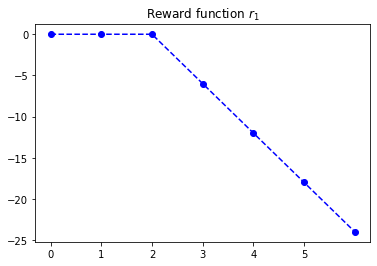

r_1 array:  [0 0 -0 -6 -12 -18 -24]
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
120000
130000
140000
150000
160000
170000
180000
190000
1


In [6]:
'''run realtime experiences'''
T = [[]for i in range(number_of_agents)]
for i in range(number_of_agents):
  T[i] = np.zeros(shape = (BATTERY_SIZE*MAX_SILENT_TIME,MAX_SILENT_TIME*BATTERY_SIZE)) #transition matrix

occupied = 0
epsilon = 1
#initialize environment 
env = [[]for i in range(number_of_agents)]
agent = [[]for i in range(number_of_agents)]
state = [[]for i in range(number_of_agents)]
actions = [[]for i in range(number_of_agents)]
for i in range(number_of_agents):
  env[i] = transmit_env(BATTERY_SIZE, MAX_SILENT_TIME, SILENT_THRESHOLD, MINIMAL_CHARGE, DISCHARGE, CHARGE, 10) 
  agent[i] = Q_transmit_agent(ALPHA, GAMMA, BATTERY_SIZE, MAX_SILENT_TIME , DATA_SIZE)
  state[i] = env[i].initial_state    
  actions[i] = agent[i].choose_action(state[i],epsilon)
  
#plot reward function in use
plt.plot(range(len(env[0].r_1)),env[0].r_1 , 'o--' , color = 'blue')
plt.xticks(range(env[0].max_silence_time))
plt.title('Reward function $r_1$')
plt.show()
print('r_1 array: ' , env[0].r_1)


#data = np.zeros(env.data_size)
errors = [[]for i in range(number_of_agents)]

for i in range(number_of_iterations):
  #all agents move a step and take a new action
  for j in range(number_of_agents):
    env[j].state = env[j].new_state

  #Gateway decision
  if sum(actions) > 1 or sum(actions) == 0:
    ack = 0
  elif sum(actions) == 1:
    ack = 1

  for j in range(number_of_agents):
    new_state, reward, occupied = env[j].time_step(actions[j],sum(actions), ack) #CHANNEL
    #errors.append(np.mean(agent.error))
    env[j].new_state = new_state

    ####################All agents make decisions (actions), the model looks at all actions and checks that only one choose to transmit, if so - reset time with ack?. Otherwise all collide, energy lost
    '''
    if occupied and action:
      data = np.append(data, 3) #collision
    elif occupied and (not action):
      data = np.append(data,2) #avoided
    elif action and (not occupied):
      data = np.append(data,1) #Clean
    else:
      data = np.append(data,0) #wasted
    data = np.delete(data, 0)
    '''
    ##############################################################################
    
    #print(env.state, env,new_state)
  for j in range(number_of_agents):  
    actions[j] = agent[j].step(env[j].state, reward, actions[j], env[j].new_state, epsilon)
  
  if i%10000 == 0:
    print(i)
  
  #collect state transitions in T
  for j in range(number_of_agents):
    #decompose state
    current_energy, slient_time = env[j].state
    #decompose new state
    next_energy, next_silence = env[j].new_state
    #print(current_energy, slient_time,'->',next_energy, next_silence , '~~~', current_energy*(BATTERY_SIZE-1)+slient_time, next_energy*(BATTERY_SIZE-1)+next_silence)
    T[j][current_energy*(BATTERY_SIZE)+slient_time, next_energy*(BATTERY_SIZE)+next_silence]+=1
    
    
    #epsilon = epsilon*decay_rate

 # env.render(data)
print(epsilon)
#plt.plot(errors)

##Get resulting policy

In [7]:
def get_policy(i):
  policy = np.zeros(shape=(agent[i].Q.shape[0],agent[i].Q.shape[1]))
  Q1 = np.zeros(shape=(agent[i].Q.shape[0],agent[i].Q.shape[1]))
  Q2 = np.zeros(shape=(agent[i].Q.shape[0],agent[i].Q.shape[1]))
  for energy in range(agent[i].Q.shape[0]):
    for time in range(agent[i].Q.shape[1]):
      if force_policy_flag == True:
        if energy < MINIMAL_CHARGE:
          policy[energy,time] = 0 
        else:
          policy[energy,time] = np.argmax(agent[i].Q[energy,time,:])
      Q1[energy,time] = agent[i].Q[energy,time,0]
      Q2[energy,time] = agent[i].Q[energy,time,1]
  #print(Q1)
  #print(Q2)
  print('Agent ', i,' policy:\n',policy)
  print('x - time, y - energy \n')
  return policy

In [8]:
def get_state_value(policy,i):
  state_value = np.zeros(shape=(agent[i].Q.shape[0],agent[i].Q.shape[1]))
  for energy in range(agent[i].Q.shape[0]):
    for time in range(agent[i].Q.shape[1]):
      state_value[energy,time] = agent[i].Q[energy,time,int(policy[energy,time])]

  return state_value

In [9]:
policy = [[]for i in range(number_of_agents)]
state_value = [[]for i in range(number_of_agents)]

for i in range(number_of_agents):
  policy[i] = get_policy(i)
  state_value[i] = get_state_value(policy[i],i)
  print(state_value[i], '\n')

Agent  0  policy:
 [[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]]
x - time, y - energy 

[[0.00732 0.0398 -4.98 -11 -13.7 -12.1]
 [0.191 -3.91 -14.7 -25.6 -32.2 -33]
 [0.037 4.27e-11 -5.19 -11.6 -18 -17.7]
 [2.62e-06 0.000467 -6 -12 -18 -18]
 [0.00276 -5.26 -15.8 -29.5 -33.3 -35.2]
 [0.00161 -5.65 -17.8 -29.4 -35.1 -30]] 

Agent  1  policy:
 [[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]]
x - time, y - energy 

[[2.59e-05 0.00422 -4.93 -11.9 -16 -13.1]
 [0.0909 -4.85 -14.8 -28.1 -29.7 -31.1]
 [0.00321 3.89e-06 -5.9 -12 -18 -17.5]
 [0.00429 1.97e-10 -5.4 -11 -17.8 -17]
 [2.77e-06 -5.59 -17.3 -29.5 -35.5 -35.4]
 [6.53e-08 -5.78 -16.4 -29.2 -32 -34.7]] 

Agent  2  policy:
 [[0 0 0 0 0 0]
 [0 0 0 0 0 0]
 [0 1 1 1 1 1]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]
 [1 1 1 1 1 1]]
x - time, y - energy 

[[0.0245 0.014 -5.25 -10.9 -15.6 -16]
 [0.122 -4.87 -14.3 -27.3 -25.8 -27.6]
 [0.0902 0.00313 -5.66 -10.7 -18 -15.8]
 [4

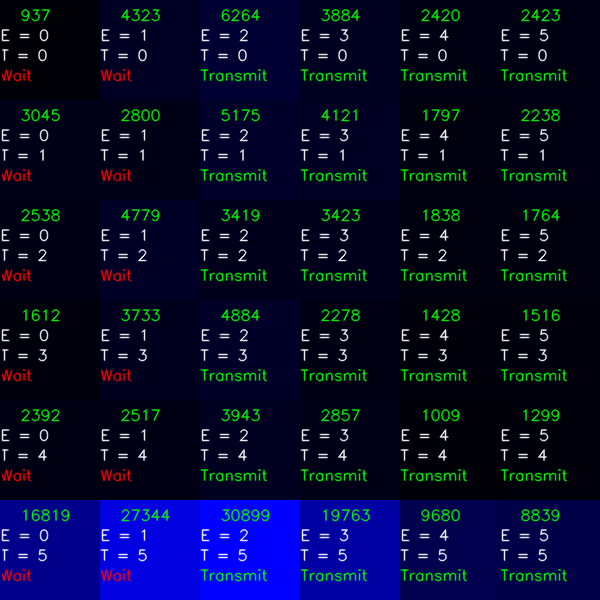

Agent  0




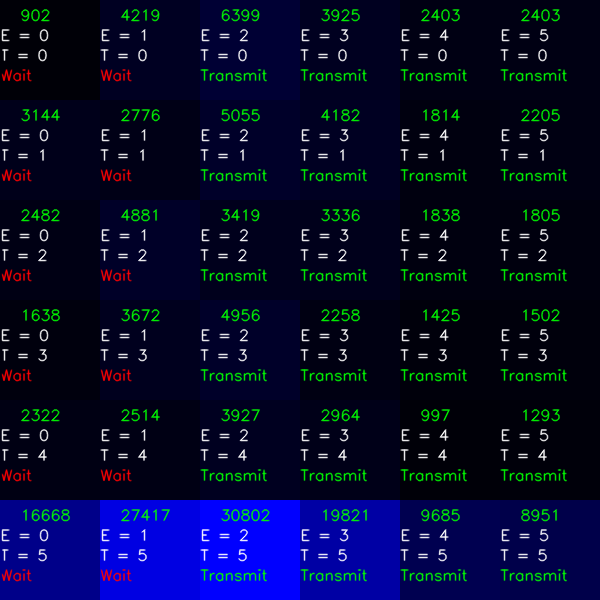

Agent  1




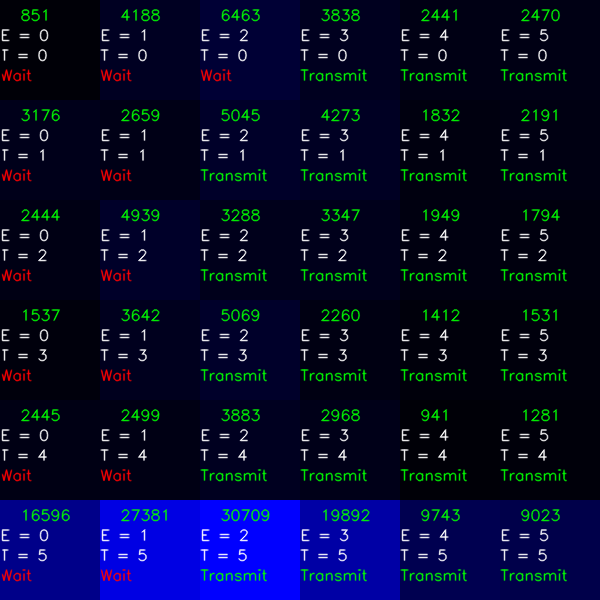

Agent  2




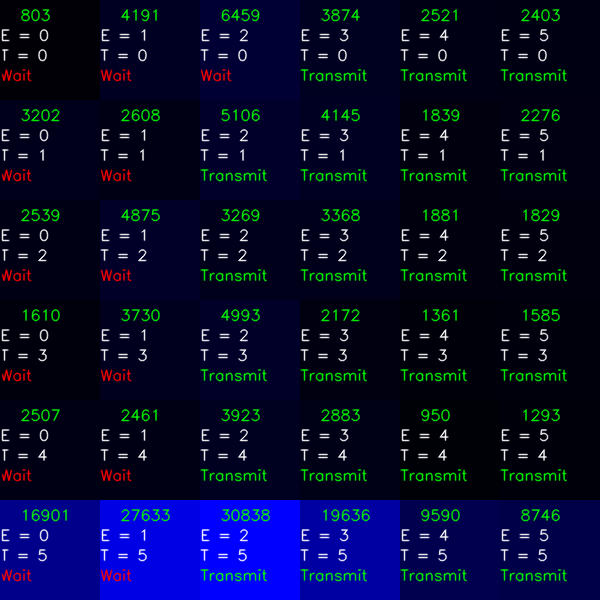

Agent  3




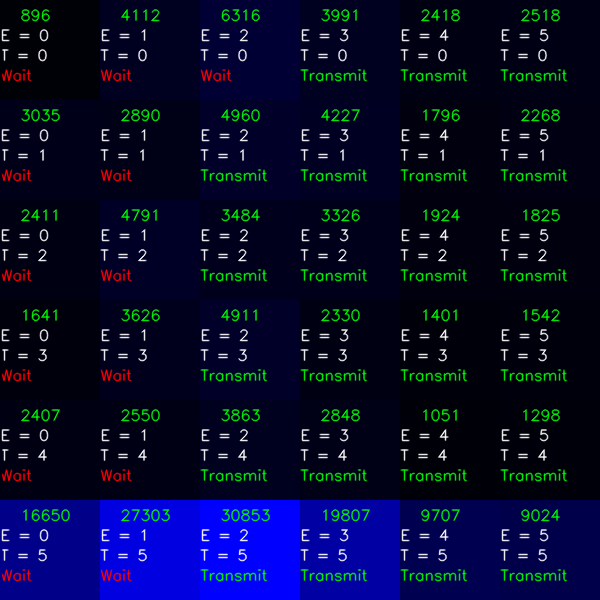

Agent  4




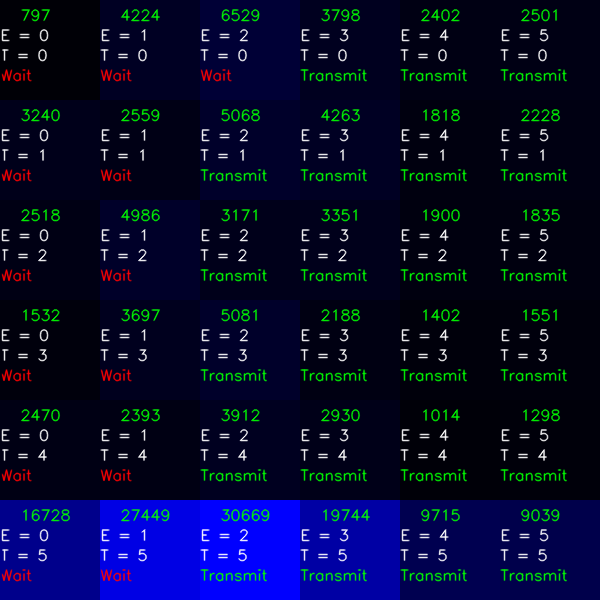

Agent  5




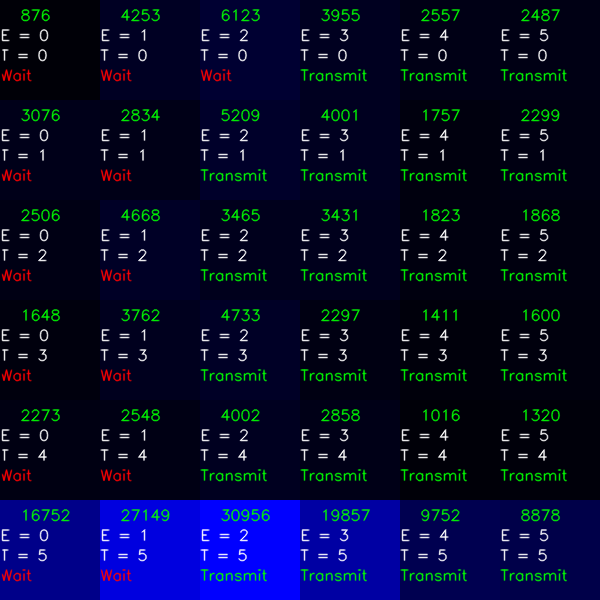

Agent  6




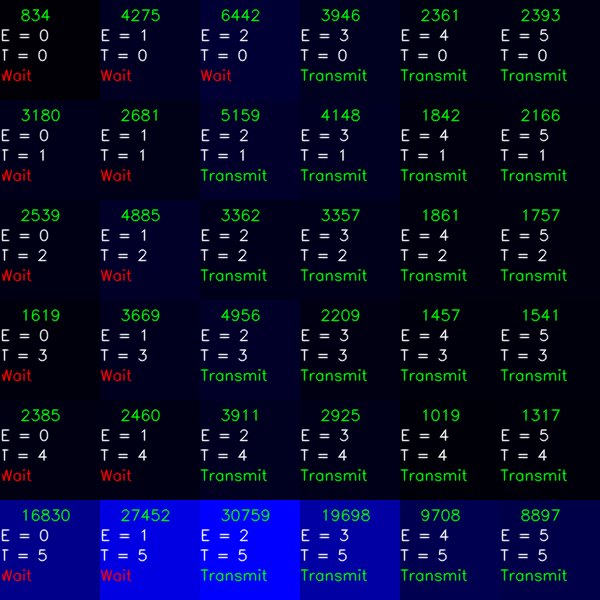

Agent  7




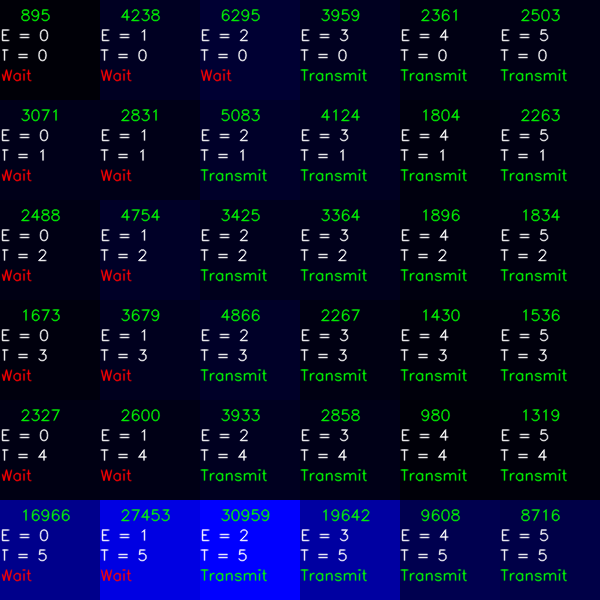

Agent  8




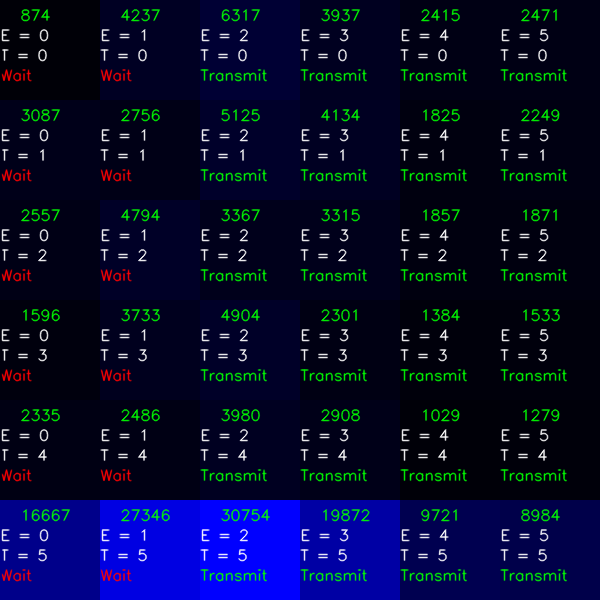

Agent  9




In [10]:
def render_policy_visits_table(table,colors_table):
  screen = pygame.display.set_mode((table.shape[0] * 100 , table.shape[1]*100))
  color = colors_table/np.max(colors_table)*255

  for i in range(table.shape[0]):
    for j in range(table.shape[1]):

      pygame.draw.rect(screen, int(color[i,j]), pygame.Rect(i*100, j*100, 100, 100))
  pygame.display.flip()

  #convert image so it can be displayed in OpenCV
  view = pygame.surfarray.array3d(screen)

  #  convert from (width, height, channel) to (height, width, channel)
  view = view.transpose([1, 0, 2])

  #  convert from rgb to bgr
  img = cv2.cvtColor(view, cv2.COLOR_RGB2BGR)
  for i in range(table.shape[0]):
    for j in range(table.shape[1]):
      img = cv2.putText(img, "%d " %colors_table[i,j] , (i*100+20,j*100+20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1, cv2.LINE_AA)
      img = cv2.putText(img, "E = %d" % i, (i*100,j*100+40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
      img = cv2.putText(img, "T = %d" % j, (i*100,j*100+60), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
      if colors_table[i,j] == 0:
        img = cv2.putText(img, "????", (i*100,j*100+80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1, cv2.LINE_AA)
      else:
        if table[i,j] == 1:
          img = cv2.putText(img, "Transmit", (i*100,j*100+80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1, cv2.LINE_AA)
        elif table[i,j] == 0:
          img = cv2.putText(img, "Wait", (i*100,j*100+80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)

           # img_bgr = cv2.putText(img_bgr, "%.3f" % value[i,j], (i*100,j*100+20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
  #else:
  #  img = cv2.putText(img_bgr, "Wait", (i*100,j*100+80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
  cv2_imshow(img)

for i in range(number_of_agents):
  render_policy_visits_table(policy[i],agent[i].state_visits)
  print('Agent ',i)
  print('\n')


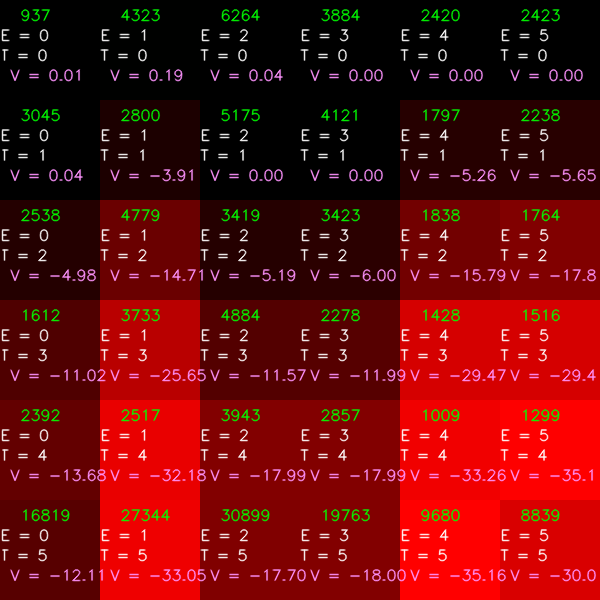

state value, color by value
Agent  0




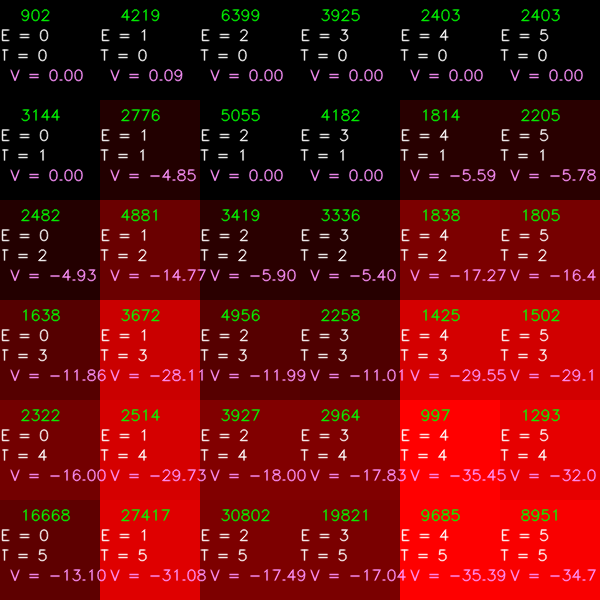

state value, color by value
Agent  1




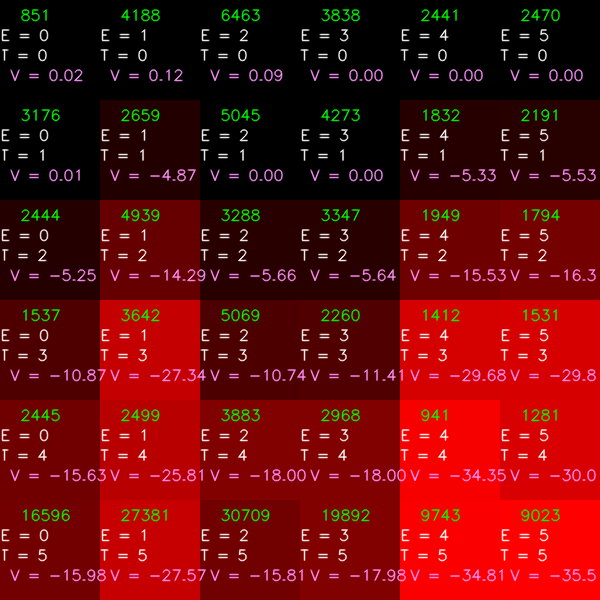

state value, color by value
Agent  2




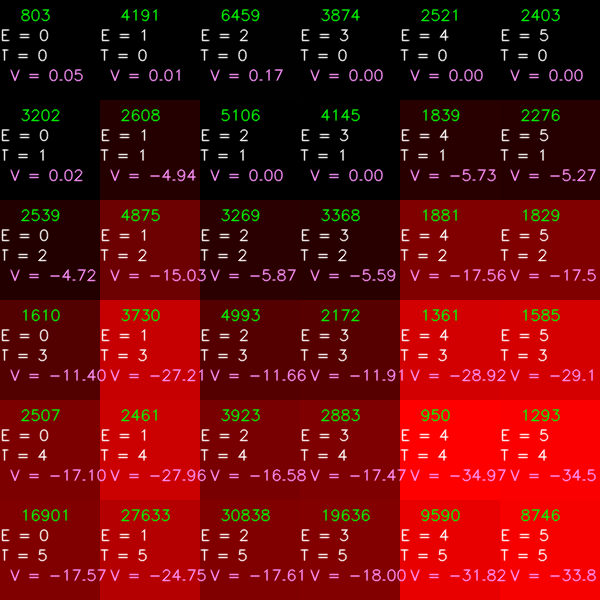

state value, color by value
Agent  3




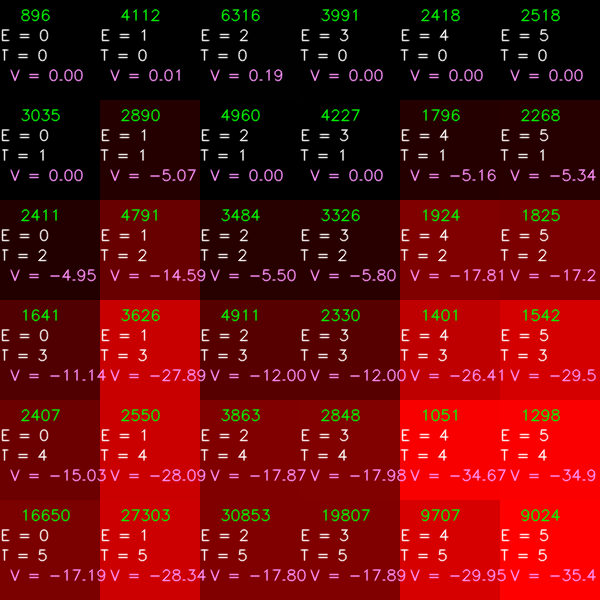

state value, color by value
Agent  4




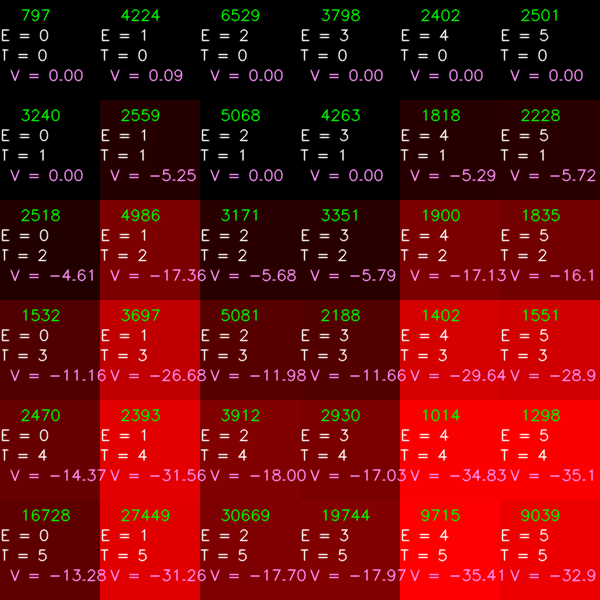

state value, color by value
Agent  5




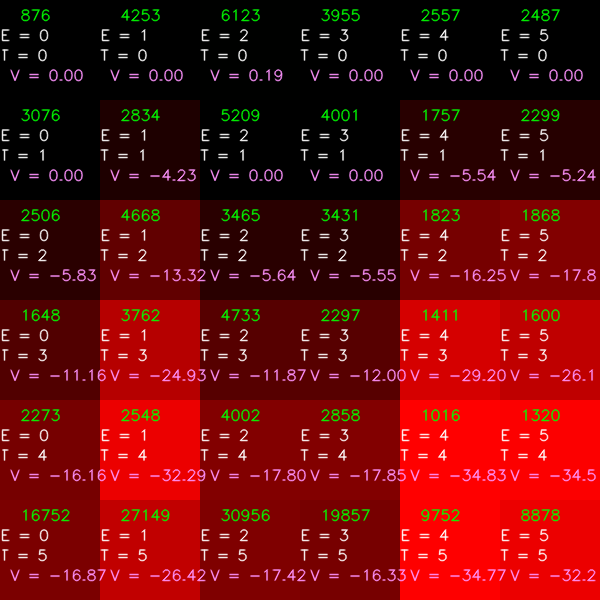

state value, color by value
Agent  6




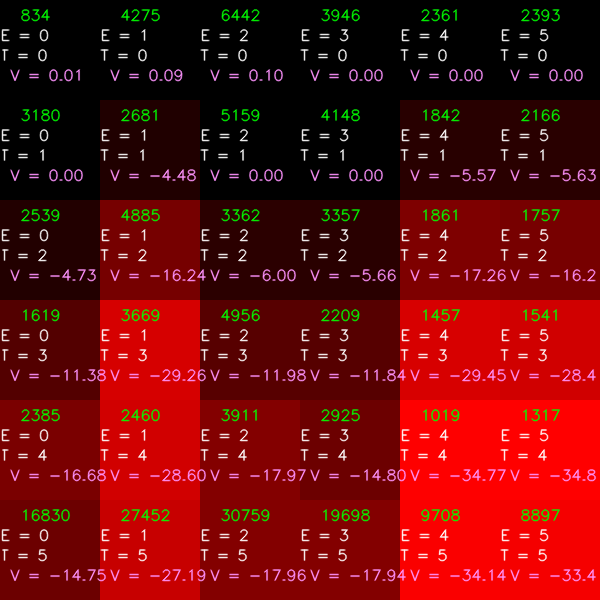

state value, color by value
Agent  7




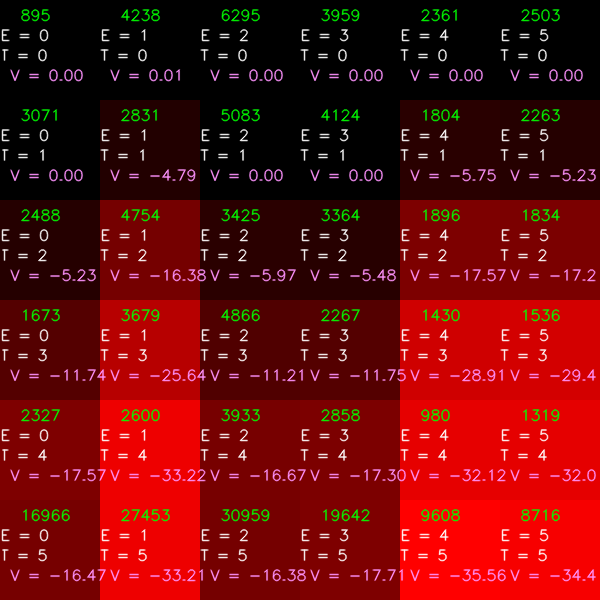

state value, color by value
Agent  8




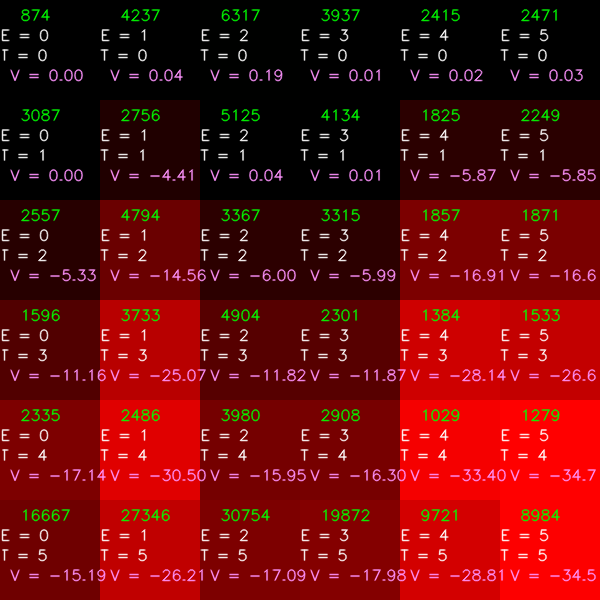

state value, color by value
Agent  9




In [11]:
def render_state_value_visits_table(table,colors_table):
  screen = pygame.display.set_mode((table.shape[0] * 100 , table.shape[1]*100))
  color = (table)/np.max(np.abs(table))*255
  for i in range(table.shape[0]):
    for j in range(table.shape[1]):
      if int(color[i,j])<0:
          pygame.draw.rect(screen,  (-int(color[i,j]), 0, 0), pygame.Rect(i*100, j*100, 100, 100))
      else:
          pygame.draw.rect(screen, (0, int(color[i,j]), 0), pygame.Rect(i*100, j*100, 100, 100))
  pygame.display.flip()

  #convert image so it can be displayed in OpenCV
  view = pygame.surfarray.array3d(screen)

  #  convert from (width, height, channel) to (height, width, channel)
  view = view.transpose([1, 0, 2])

  #  convert from rgb to bgr
  img = cv2.cvtColor(view, cv2.COLOR_RGB2BGR)
  for i in range(table.shape[0]):
    for j in range(table.shape[1]):
      img = cv2.putText(img, "%d " %colors_table[i,j] , (i*100+20,j*100+20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1, cv2.LINE_AA)
      img = cv2.putText(img, "E = %d" % i, (i*100,j*100+40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
      img = cv2.putText(img, "T = %d" % j, (i*100,j*100+60), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

      img = cv2.putText(img, "V = %.2f" % table[i,j], (i*100+10,j*100+80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 147, 255), 1, cv2.LINE_AA)

  cv2_imshow(img)

for i in range(number_of_agents):
  render_state_value_visits_table(state_value[i],agent[i].state_visits)
  print('state value, color by value')
  print('Agent ',i)
  print('\n')


Difference Q1 - Q2 (wait - transmit)


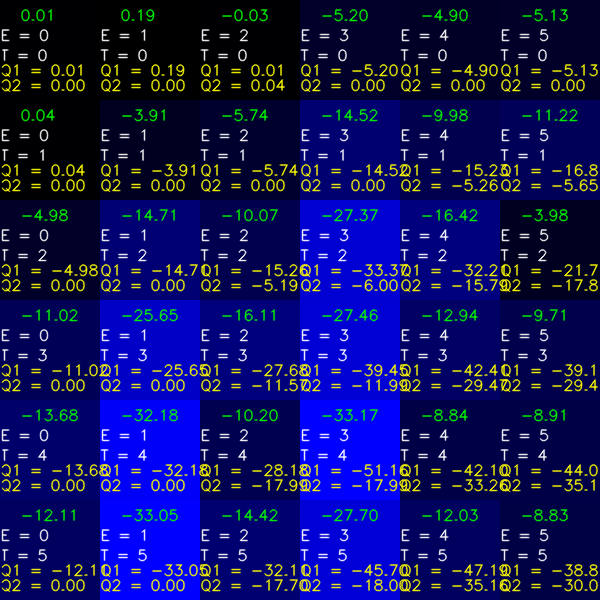

Agent  0


Difference Q1 - Q2 (wait - transmit)


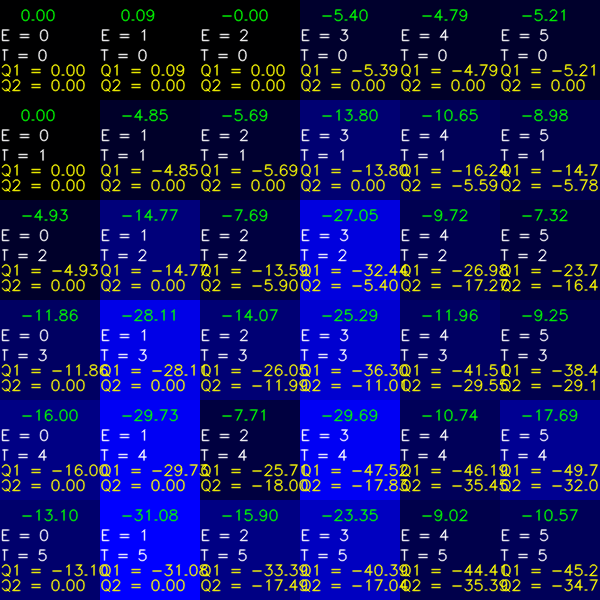

Agent  1


Difference Q1 - Q2 (wait - transmit)


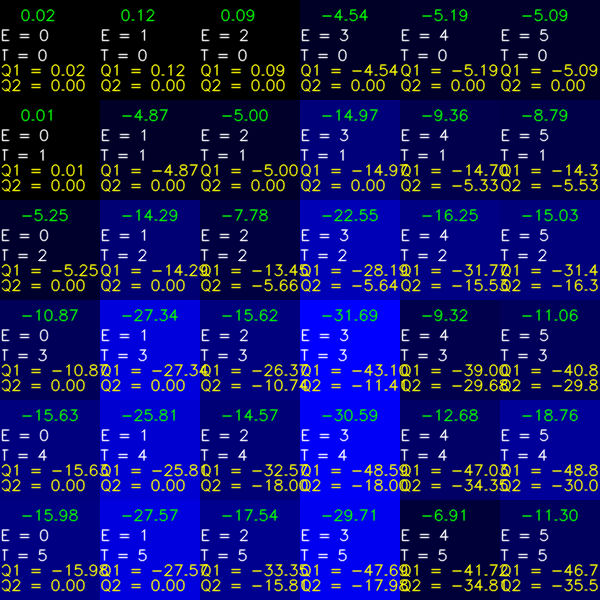

Agent  2


Difference Q1 - Q2 (wait - transmit)


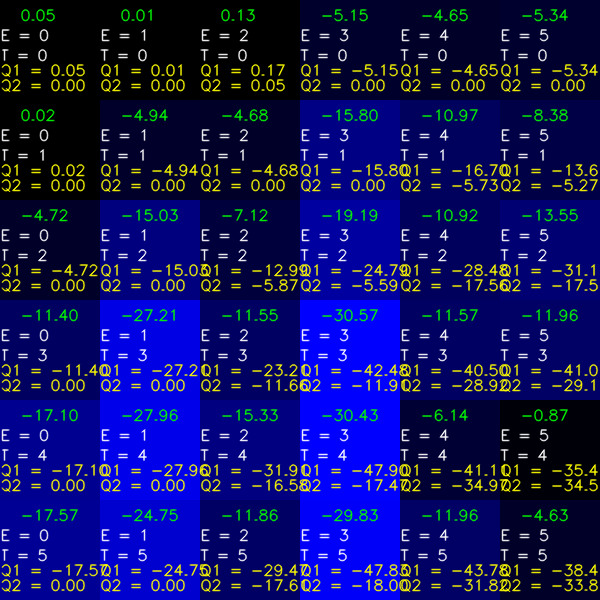

Agent  3


Difference Q1 - Q2 (wait - transmit)


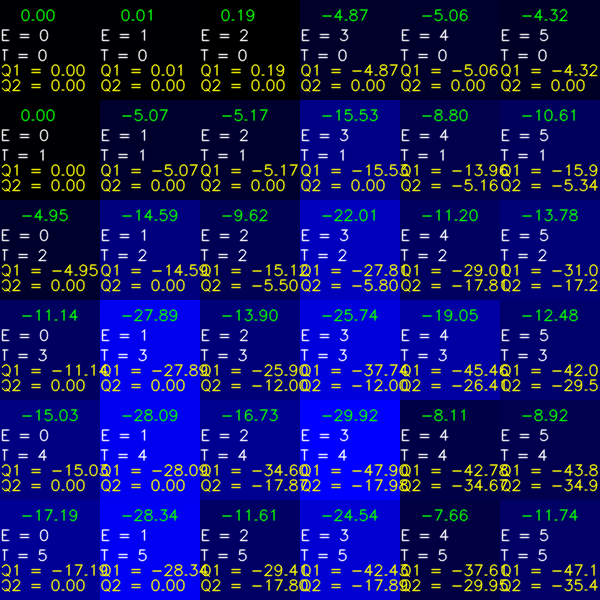

Agent  4


Difference Q1 - Q2 (wait - transmit)


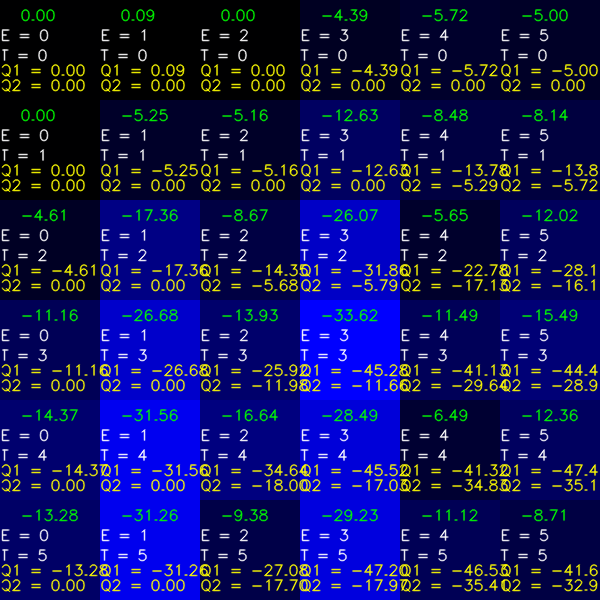

Agent  5


Difference Q1 - Q2 (wait - transmit)


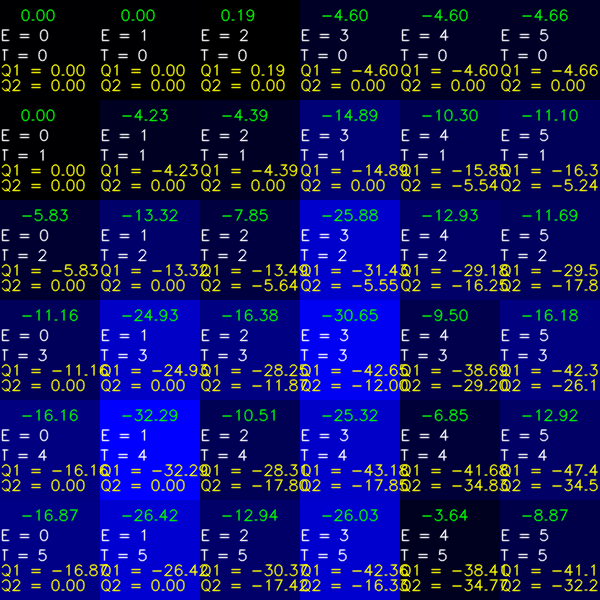

Agent  6


Difference Q1 - Q2 (wait - transmit)


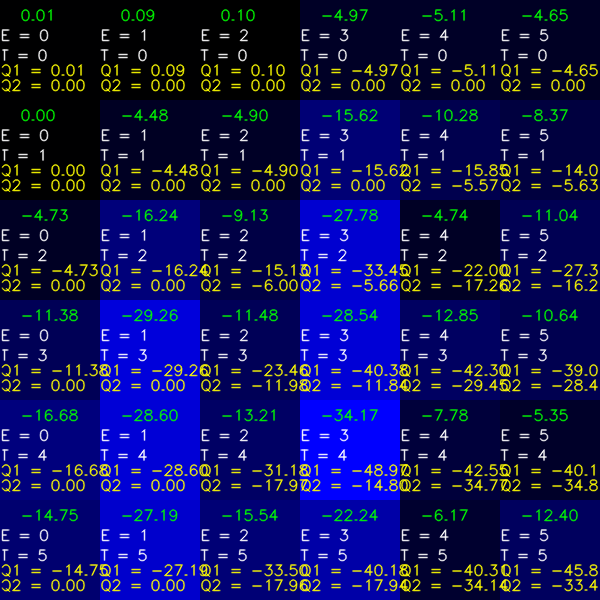

Agent  7


Difference Q1 - Q2 (wait - transmit)


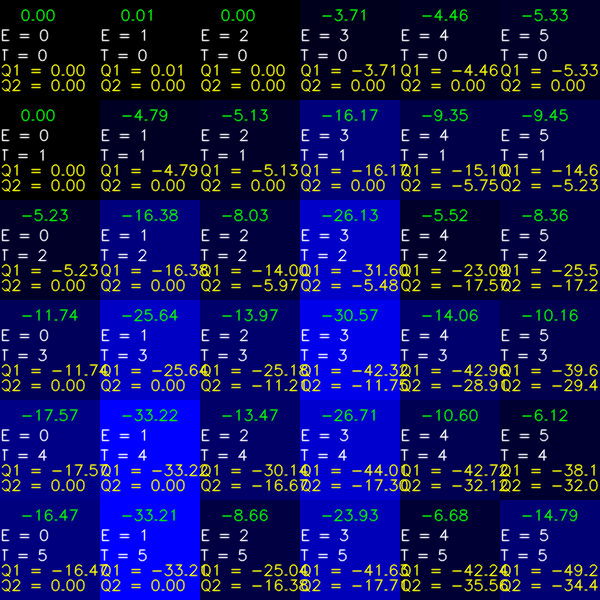

Agent  8


Difference Q1 - Q2 (wait - transmit)


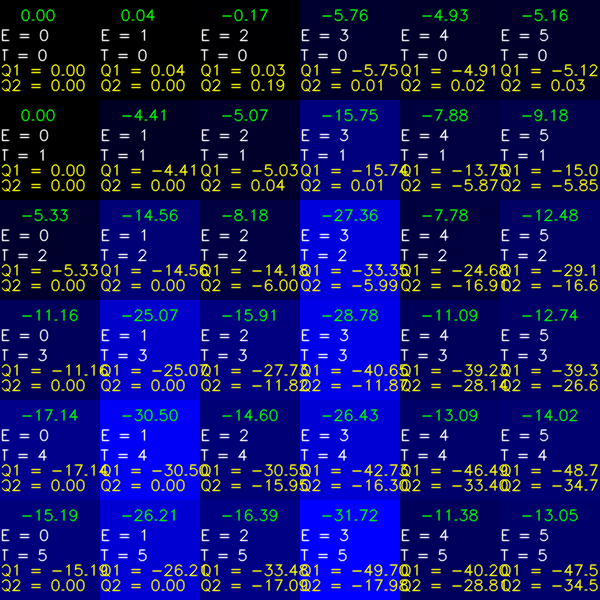

Agent  9




In [12]:
def render_Q_diffs(Q1,Q2):
  screen = pygame.display.set_mode((Q1.shape[0] * 100 , Q1.shape[1]*100))
  diff = (Q1 - Q2)
  diff_pos = diff-np.min(diff)# shift to posetive
  color = diff_pos/np.max(diff_pos)*255

  print('Difference Q1 - Q2 (wait - transmit)')
  for i in range(Q1.shape[0]):
    for j in range(Q1.shape[1]):

      pygame.draw.rect(screen, 255-int(color[i,j]), pygame.Rect(i*100, j*100, 100, 100))
  pygame.display.flip()

  #convert image so it can be displayed in OpenCV
  view = pygame.surfarray.array3d(screen)

  #  convert from (width, height, channel) to (height, width, channel)
  view = view.transpose([1, 0, 2])

  #  convert from rgb to bgr
  img = cv2.cvtColor(view, cv2.COLOR_RGB2BGR)

  for i in range(Q1.shape[0]):
    for j in range(Q2.shape[1]):
      img = cv2.putText(img, "%.2f " %diff[i,j] , (i*100+20,j*100+20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1, cv2.LINE_AA)
      img = cv2.putText(img, "E = %d" % i, (i*100,j*100+40), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
      img = cv2.putText(img, "T = %d" % j, (i*100,j*100+60), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
      img = cv2.putText(img, "Q1 = %.2f" %Q1[i,j], (i*100,j*100+75), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1, cv2.LINE_AA)
      img = cv2.putText(img, "Q2 = %.2f" %Q2[i,j], (i*100,j*100+90), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1, cv2.LINE_AA)


           # img_bgr = cv2.putText(img_bgr, "%.3f" % value[i,j], (i*100,j*100+20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
  #else:
  #  img = cv2.putText(img_bgr, "Wait", (i*100,j*100+80), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
  cv2_imshow(img)

for i in range(number_of_agents):
  render_Q_diffs(agent[i].Q[:,:,0],agent[i].Q[:,:,1])
  print('Agent ',i)
  print('\n')

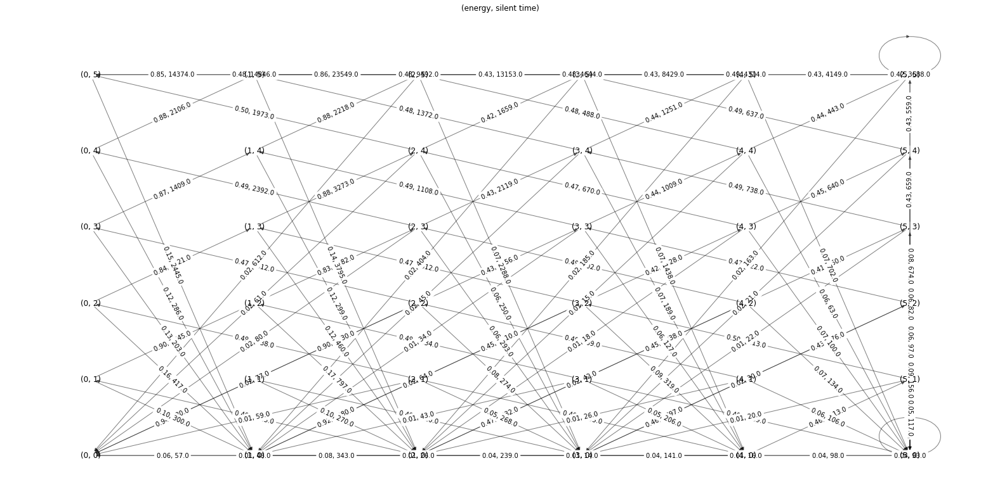

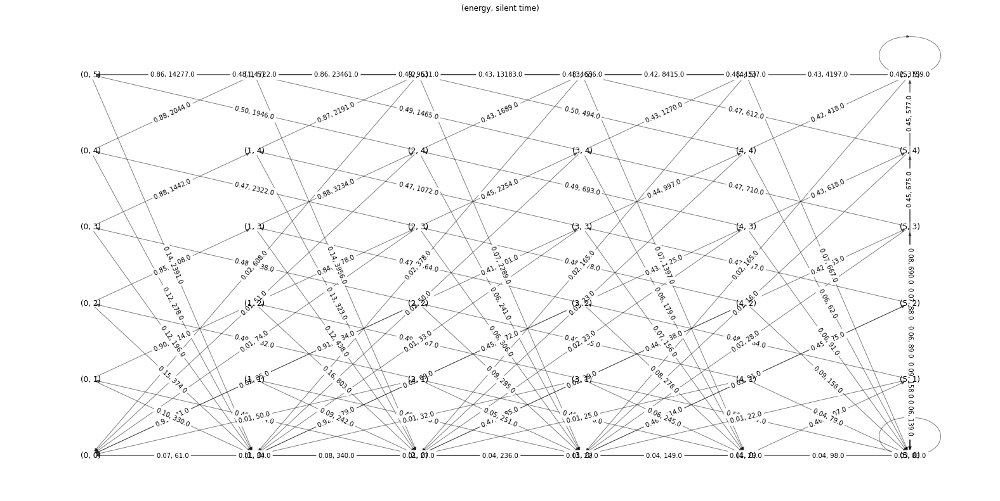

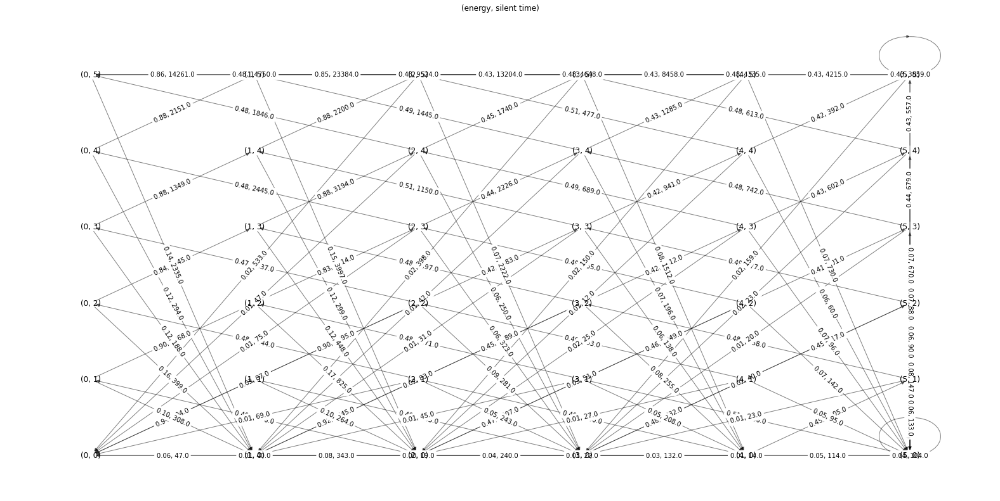

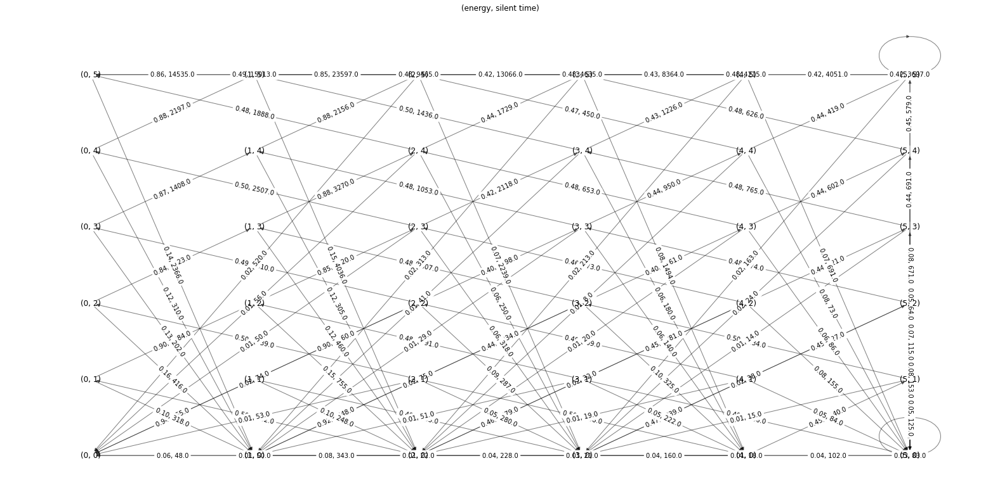

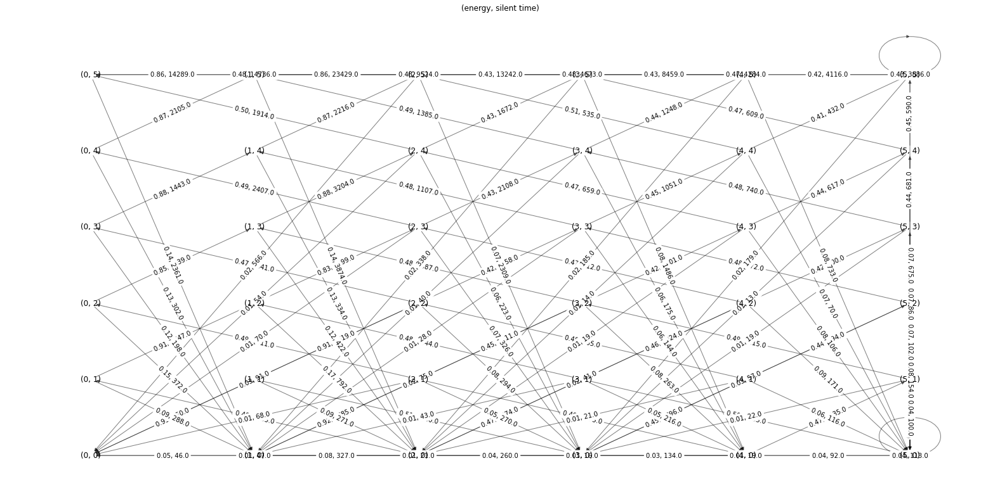

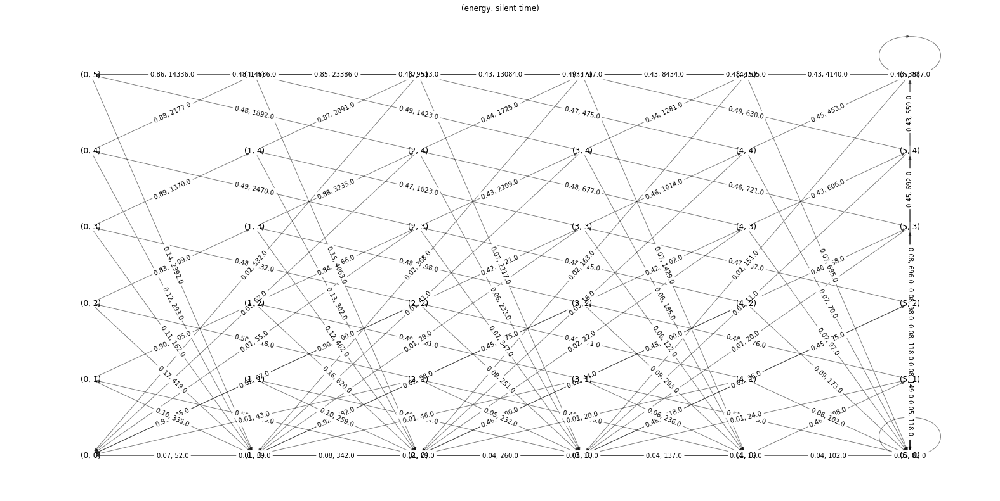

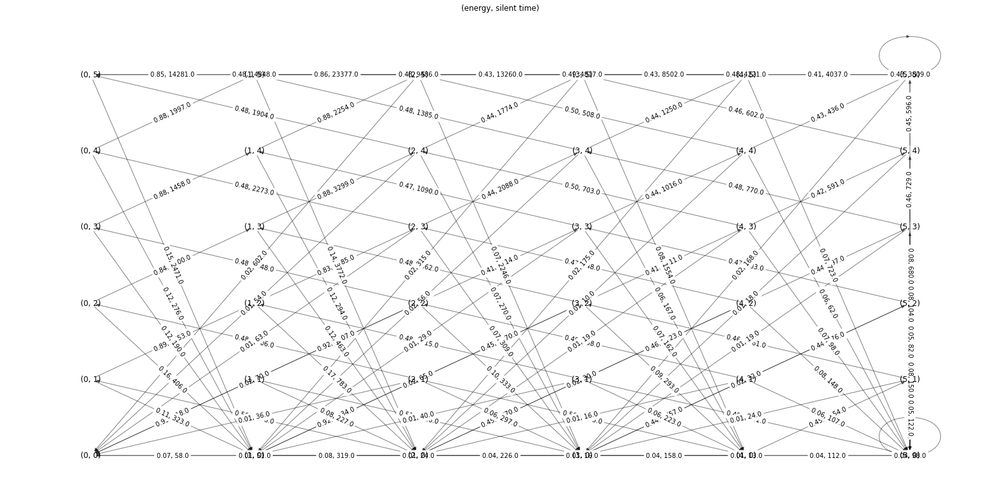

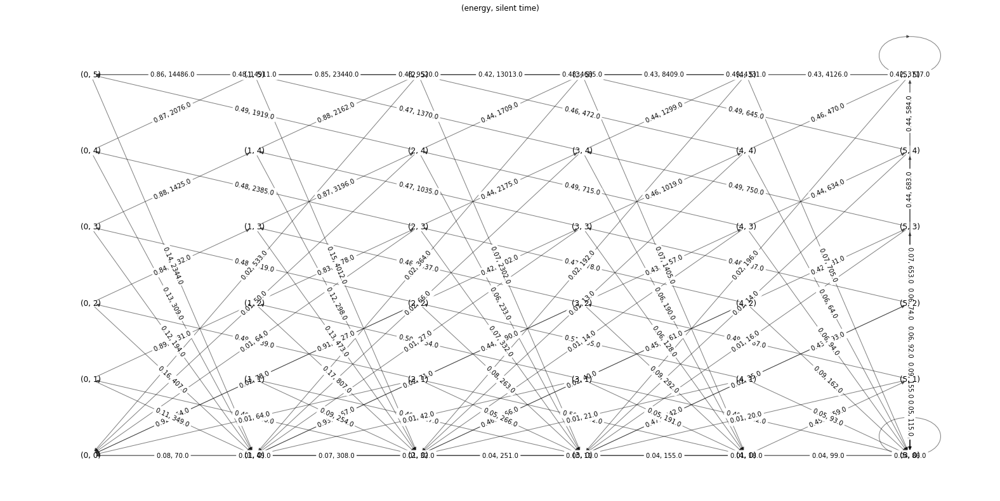

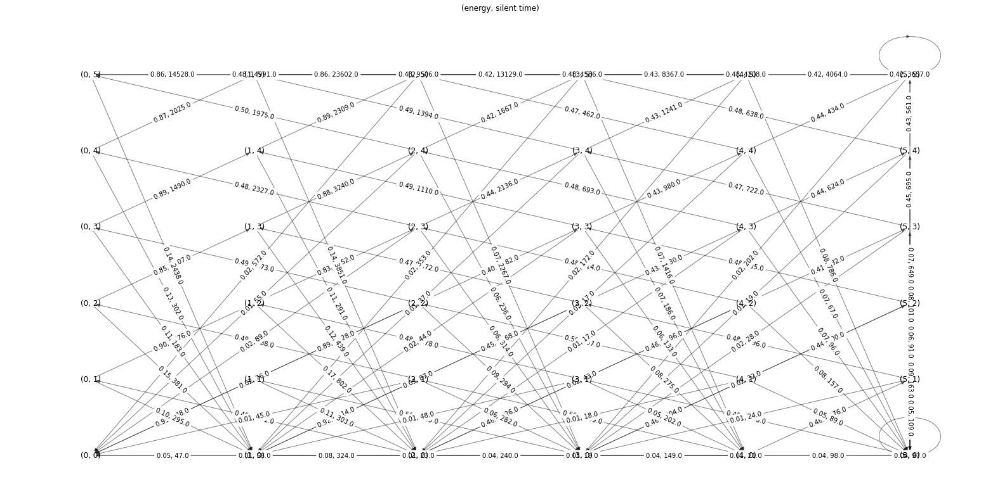

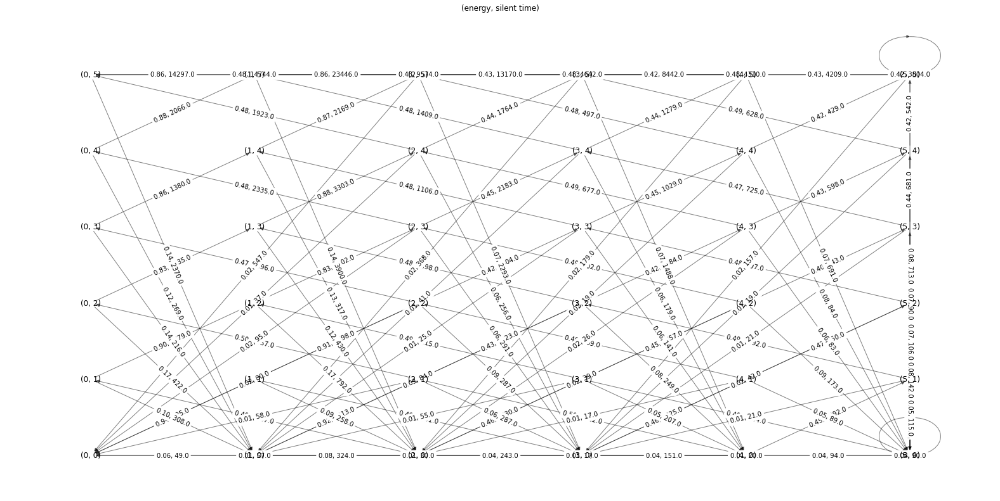

In [13]:
#Create State transition table
states = [[]for i in range(number_of_agents)]
for a in range(number_of_agents):
  for i in range(agent[a].Q.shape[0]):
    for j in range(agent[a].Q.shape[1]):
      states[a].append((i,j))

#Create state machine graph for each agent
G = [[]for i in range(number_of_agents)]
labels = [{}for i in range(number_of_agents)]
edge_labels = [{}for i in range(number_of_agents)]

for a in range(number_of_agents):
  G[a] = nx.MultiDiGraph()
  labels={}
  edge_labels={}

#draw draphs
for a in range(number_of_agents):
  for i, origin_state in enumerate(states[a]):
      for j, destination_state in enumerate(states[a]):
          rate = normalize(T[a], axis=1, norm='l1')[i][j]
          if rate > 0:
              G[a].add_edge(origin_state,
                        destination_state,
                        weight=rate,
                        label="{:.02f}, {d}".format(rate, d =T[a][i][j]))
              edge_labels[(origin_state, destination_state)] = label="{:.02f}, {d}".format(rate, d =T[a][i][j])


  plt.figure(figsize=(28,14))
  node_size = 200
  pos = {state:list(state) for state in states[a]}
  nx.draw_networkx_edges(G[a],pos,width=1.0,alpha=0.5)
  nx.draw_networkx_labels(G[a], pos, font_weight=2)
  nx.draw_networkx_edge_labels(G[a], pos, edge_labels)
  plt.title('(energy, silent time)')
  plt.axis('off');
  write_dot(G[a], "mc_agent{d}.dot".format(d =a))

In [14]:
for a in range(number_of_agents):
  s = Source.from_file("mc_agent{d}.dot".format(d =a))
  s.view()


##**Agent evaluation $\epsilon = 0$**

In [15]:
#No exploration
epsilon = 0

collisions=0
agent_clean = [np.zeros(1)for i in range(number_of_agents)]

wasted=0

num_of_eval_iner = 1000
Teval = [[]for i in range(number_of_agents)]
for a in range(number_of_agents):
  Teval[a] = np.zeros(shape = (BATTERY_SIZE*MAX_SILENT_TIME,MAX_SILENT_TIME*BATTERY_SIZE)) #transition matrix

for i in range(num_of_eval_iner):
  for a in range(number_of_agents):
    env[a].state = env[a].new_state
  
  #Gateway decision
  if sum(actions) > 1 or sum(actions) == 0:
    ack = 0
  elif sum(actions) == 1:
    ack = 1
  
  
  if sum(actions) > 1:
    collisions+=1
  if sum(actions) == 1:
    for a in range(number_of_agents):
      if actions[a]==1:
        agent_clean[a]+=1
  if sum(actions) == 0:
    wasted +=1

  for a in range(number_of_agents):
    new_state, reward, occupied = env[a].time_step(actions[a],sum(actions), ack) #CHANNEL
    env[a].new_state = new_state
  
  for a in range(number_of_agents):  
    #print(env.state, env,new_state)
    actions[a] = agent[a].step(env[a].state, reward, actions[a], env[a].new_state, epsilon)
  
  for a in range(number_of_agents):    
    #decompose state
    current_energy, slient_time = env[a].state
    #decompose new state
    next_energy, next_silence = env[a].new_state
    #print(current_energy, slient_time,'->',next_energy, next_silence , '~~~', current_energy*(BATTERY_SIZE-1)+slient_time, next_energy*(BATTERY_SIZE-1)+next_silence)
    Teval[a][current_energy*(BATTERY_SIZE)+slient_time, next_energy*(BATTERY_SIZE)+next_silence]+=1
print ('collisions',collisions)
for a in range(number_of_agents):
  print('agent{d}'.format(d =a),agent_clean[a])
print ('wasted',wasted)

collisions 416
agent0 [0]
agent1 [0]
agent2 [0]
agent3 [0]
agent4 [0]
agent5 [292]
agent6 [0]
agent7 [0]
agent8 [0]
agent9 [292]
wasted 0


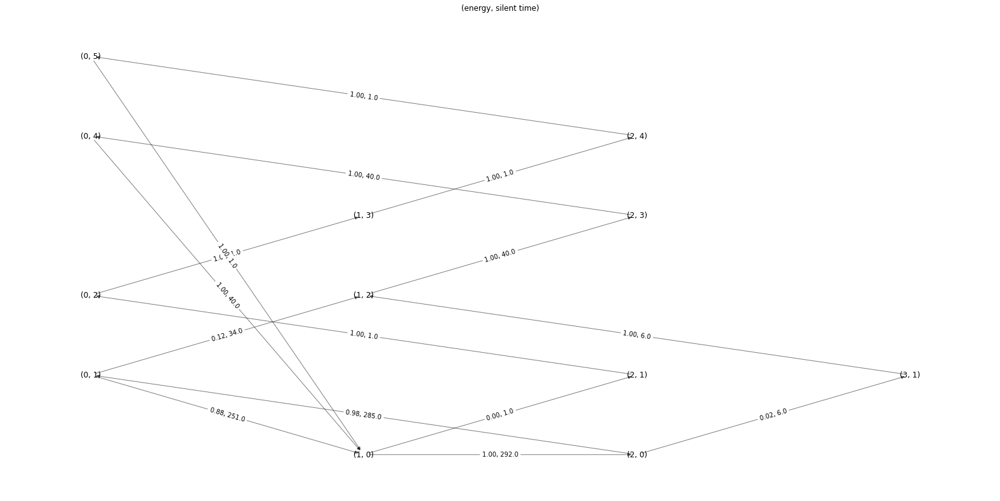

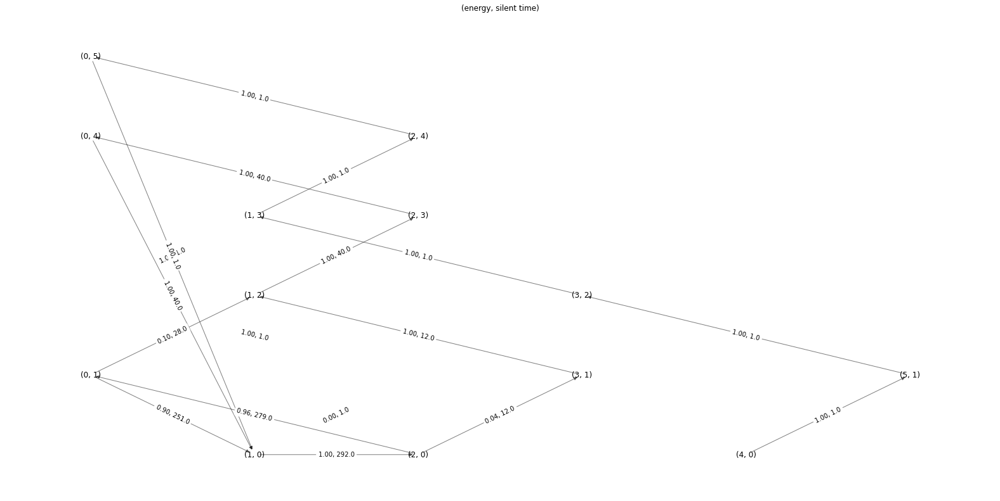

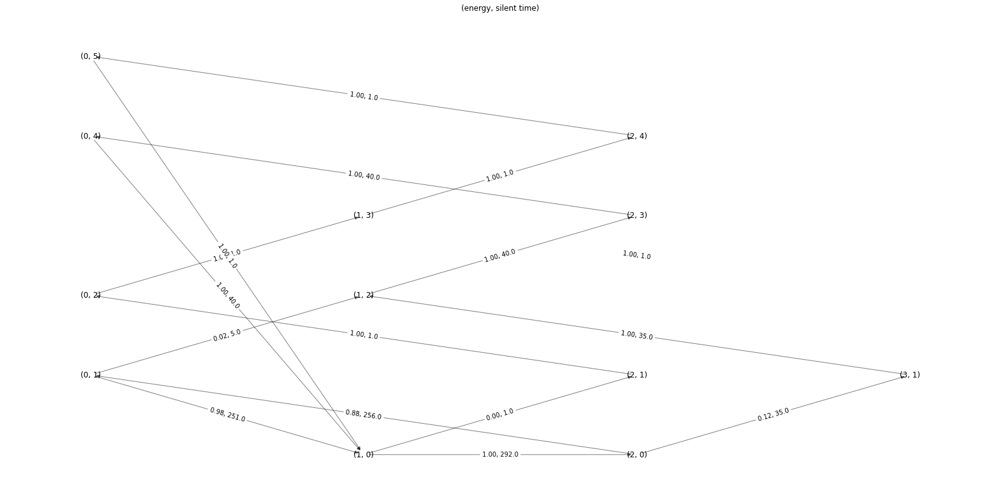

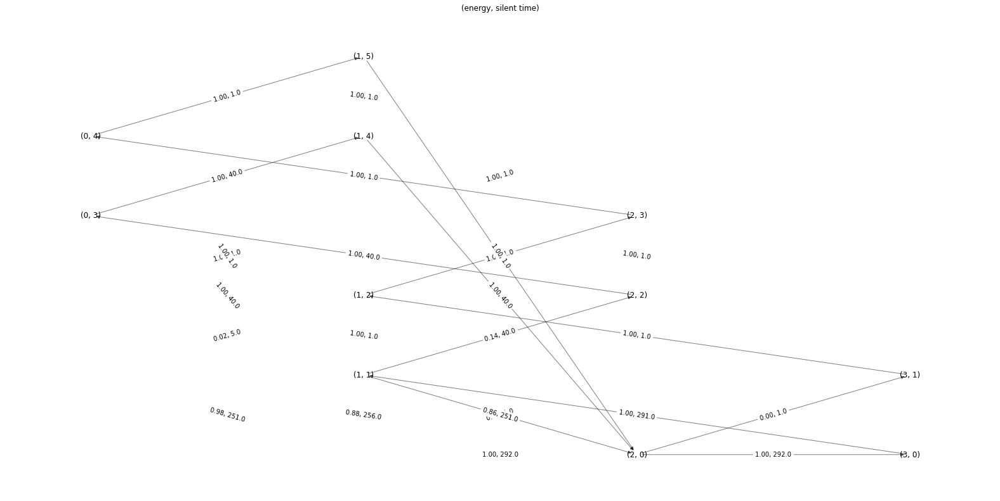

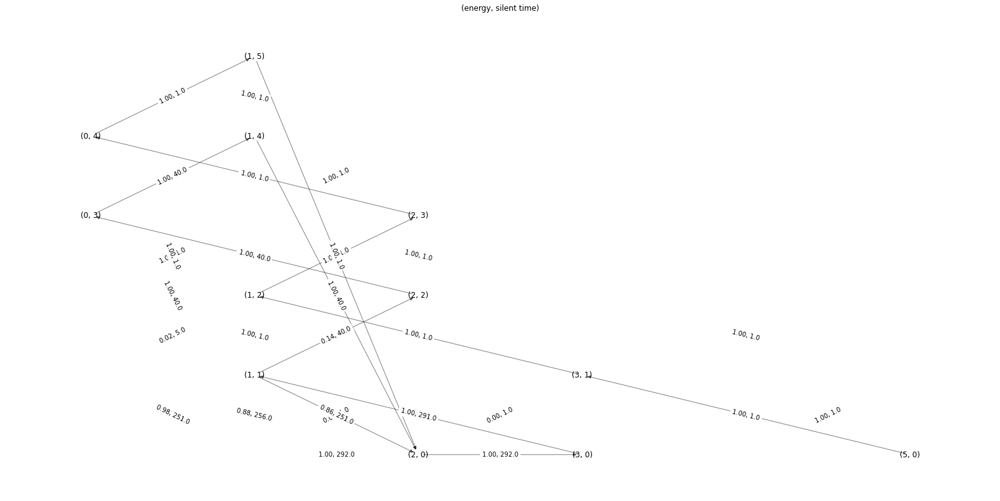

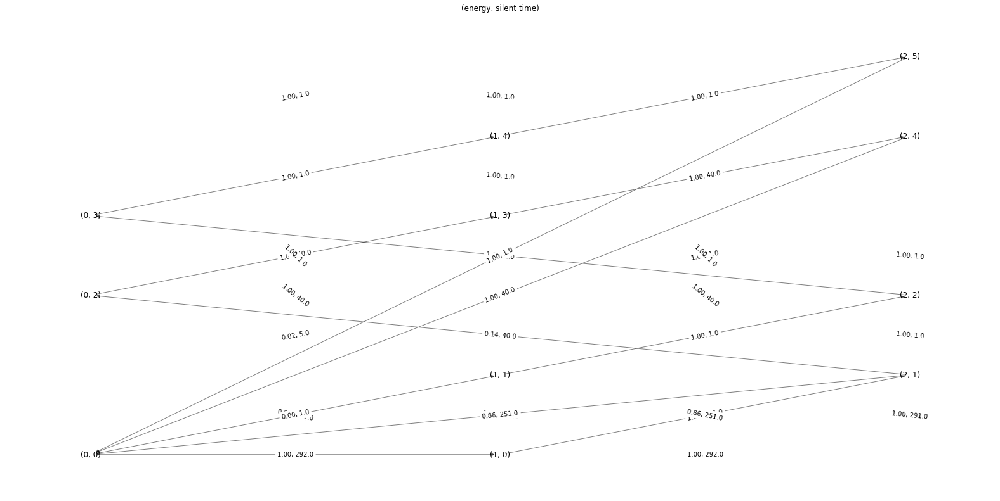

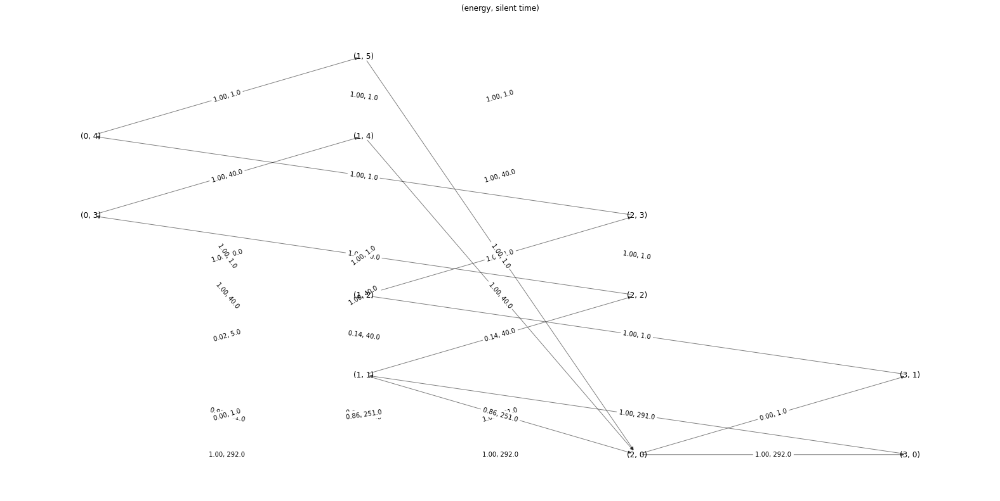

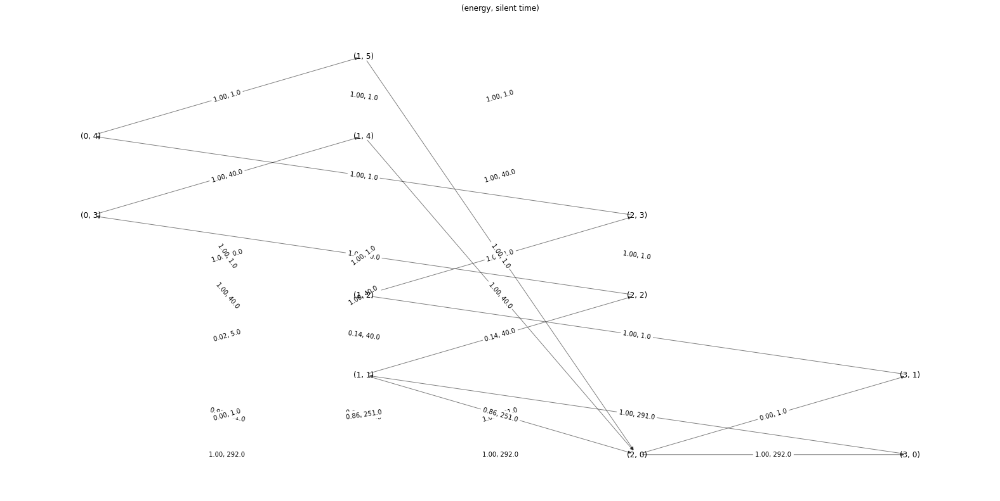

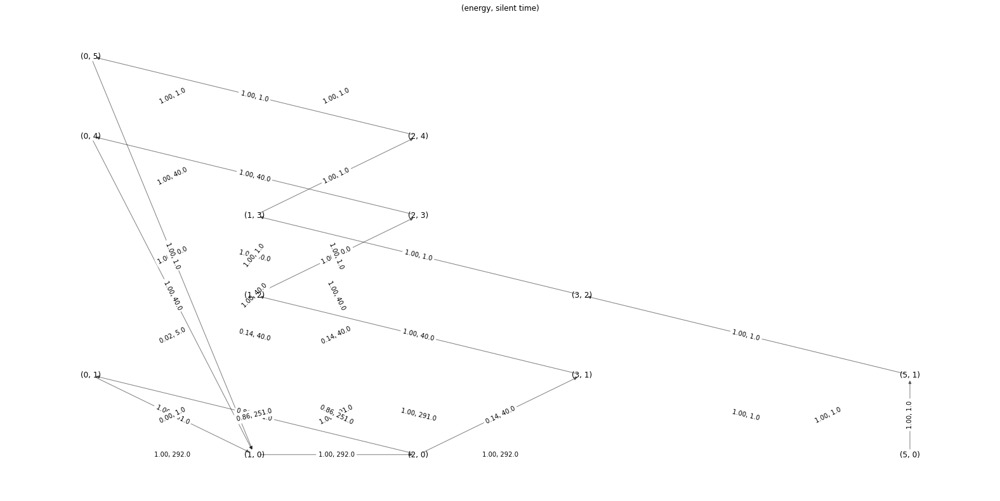

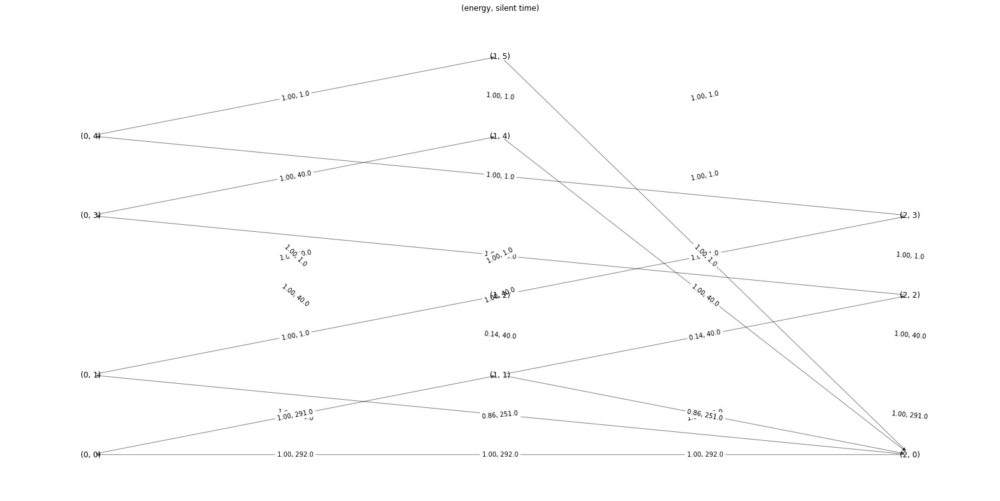

In [16]:
#Create State transition table
states = [[]for i in range(number_of_agents)]
for a in range(number_of_agents):
  for i in range(agent[a].Q.shape[0]):
    for j in range(agent[a].Q.shape[1]):
      states[a].append((i,j))

#Create state machine graph for each agent
G = [[]for i in range(number_of_agents)]
labels = [{}for i in range(number_of_agents)]
edge_labels = [{}for i in range(number_of_agents)]

for a in range(number_of_agents):
  G[a] = nx.MultiDiGraph()
  labels={}
  edge_labels={}

#draw draphs
for a in range(number_of_agents):
  for i, origin_state in enumerate(states[a]):
      for j, destination_state in enumerate(states[a]):
          rate = normalize(Teval[a], axis=1, norm='l1')[i][j]
          if rate > 0:
              G[a].add_edge(origin_state,
                        destination_state,
                        weight=rate,
                        label="{:.02f}, {d}".format(rate, d =Teval[a][i][j]))
              edge_labels[(origin_state, destination_state)] = label="{:.02f}, {d}".format(rate, d =Teval[a][i][j])


  plt.figure(figsize=(28,14))
  node_size = 200
  pos = {state:list(state) for state in states[a]}
  nx.draw_networkx_edges(G[a],pos,width=1.0,alpha=0.5)
  nx.draw_networkx_labels(G[a], pos, font_weight=2)
  nx.draw_networkx_edge_labels(G[a], pos, edge_labels)
  plt.title('(energy, silent time)')
  plt.axis('off');
  write_dot(G[a], "mc_agent_eval{d}.dot".format(d =a))

In [17]:
for a in range(number_of_agents):
  s = Source.from_file("mc_agent_eval{d}.dot".format(d =a))
  s.view()


##Deploy agent
